In [1]:
# import os
# os.environ['KAGGLE_USERNAME'] = "syedmjafri" 
# os.environ['KAGGLE_KEY'] = "d30bb0472faa4934632c0057ebbfe683"
# !kaggle competitions download -c ieee-fraud-detection
# !mv test_identity.csv.zip testid.zip
# !mv test_transaction.csv.zip testtrans.zip
# !mv train_transaction.csv.zip traintrans.zip
# !mv train_identity.csv.zip trainid.zip
# !unzip testid.zip
# !unzip testtrans.zip
# !unzip trainid.zip
# !unzip traintrans.zip
# !rm testid.zip
# !rm testtrans.zip
# !rm trainid.zip
# !rm traintrans.zip

# LIBRARIES USED

In [1]:
import os
import random
import numpy as np
import pandas as pd
import datetime
import sklearn
from sklearn import datasets, svm, tree, preprocessing, metrics
import sklearn.ensemble as ske
import seaborn as sns
import plotly.figure_factory as ff
from plotly.offline import iplot, init_notebook_mode
import matplotlib.pyplot as plt
%matplotlib inline
import gc
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score
import matplotlib.gridspec as gridspec
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support,classification_report,confusion_matrix
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import sklearn.metrics as metrics


C:\Users\Mudabbir\Anaconda3\envs\tensorflow\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



# DATA IMPORT

In [62]:
%%time
os.chdir('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data')
test_identity = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/test_identity.csv')
test_transaction = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/test_transaction.csv')
train_identity = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/train_identity.csv')
train_transaction = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/train_transaction.csv')
print("Data Loaded!")

Data Loaded!
Wall time: 45.7 s


# DEFINED FUNCTIONS USE

In [63]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
LE = LabelEncoder()
LB = LabelBinarizer()


def pre_processing_encoder(df):
    counter_LB = 0
    counter_LE = 0
    column_names = df.dtypes[df.dtypes=='O'] # Take all the objects
    column_names = [x for x in column_names.index]
    unique_dict = {} # Create Dictionary
    for x in column_names: # Create a loop to only get only unique values
        unique_dict[x] = len((df[x].dropna().unique()))
        df[column_names]=df[column_names].fillna('NaN') # fill nans with "NaN"
    for x,y in unique_dict.items(): # Encode based on number of unique values
        if y <= 1:
            df[x]= LB.fit_transform(df[x])
            counter_LB+=1
        else:
            df[x] = LE.fit_transform(df[x])
            counter_LE+=1
    return print(f'Successfully Converted {counter_LB+counter_LE} columns\nLabel Binarizer:{counter_LB} \nLabel Encoder:{counter_LE}')

# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
# WARNING! THIS CAN DAMAGE THE DATA 
def reduce_mem_usage2(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df


def upper_case_function(df):
    column_names = df.dtypes[df.dtypes=='O']
    column_names = [x for x in column_names.index]
    for x in column_names:
        df[x]= df[x].str.upper()


def plot_distribution(df, var_select=None, title=None, bins=1.0): 
    # Calculate the correlation coefficient between the new variable and the target
    tmp_fraud = df[df['isFraud'] == 1]
    tmp_no_fraud = df[df['isFraud'] == 0]    
    corr = df['isFraud'].corr(df[var_select])
    corr = np.round(corr,3)
    tmp1 = tmp_fraud[var_select].dropna()
    tmp2 = tmp_no_fraud[var_select].dropna()
    hist_data = [tmp1, tmp2]
    
    group_labels = ['Fraud', 'No Fraud']
    colors = ['seagreen','indianred', ]

    fig = ff.create_distplot(hist_data,
                             group_labels,
                             colors = colors, 
                             show_hist = True,
                             curve_type='kde', 
                             bin_size = bins
                            )
    
    fig['layout'].update(title = title+' '+'(corr target ='+ str(corr)+')')

    iplot(fig, filename = 'Density plot')

# DATA MERGE

In [64]:
%%time
# let's combine the data and work with the whole dataset
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')

Wall time: 16.7 s


# Exploration & VISUALIZATION

In [65]:
# Name of columns with objects
column_names = train.dtypes[train.dtypes=='O']
column_names = [x for x in column_names.index]

In [66]:
# Uppercase all columns for improved look for visualization
for x in column_names:
  train[x]= train[x].str.upper()
  test[x]= test[x].str.upper() 

In [67]:
# Add is fraud column
column_names.append('isFraud')
df_explore = train[column_names]
# Finding descriptions of the dataset
total_records_train = len(df_explore['isFraud'])
fraud_0_train = len(df_explore[df_explore['isFraud']==0])
fraud_1_train = len(df_explore[df_explore['isFraud']==1])

In [68]:
# dataframe with objects only
df_objects=df_explore.drop(columns=['isFraud'])

In [69]:
list_of_objects=[]
dict = {}
for columns1 in df_objects.columns:
  list_of_objects.append(df_objects[columns1].unique())

In [70]:
list_of_objects=[]
dict1 = {}
for columns1 in df_objects.columns:
   dict1[columns1]= len(df_objects[columns1].unique())

In [71]:
unique_list=[]
for x in range(len(list_of_objects)):
  for y in list_of_objects[x]:
    unique_list.append(y)
unique_list = set(unique_list)

In [72]:
print(f'We have a total of {total_records_train} records with {fraud_1_train} fraud which is {round(fraud_1_train/total_records_train,6)*100}% for our training dataset.')
print(f'We have a total of {len(unique_list)} unique objects that are contained in {len(df_objects.columns)} columns.')
print(f'Our merged data set has a shape of {train.shape} for our train and {test.shape} for our test data set.')

We have a total of 590540 records with 20663 fraud which is 3.499% for our training dataset.
We have a total of 0 unique objects that are contained in 31 columns.
Our merged data set has a shape of (590540, 434) for our train and (506691, 433) for our test data set.


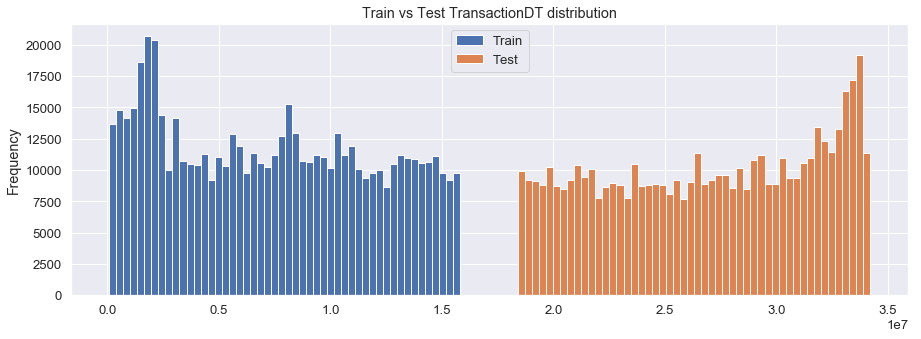

In [73]:
train_transaction['TransactionDT'].plot(kind='hist',
                                        figsize=(15, 5),
                                        label='Train',
                                        bins=50,
                                        title='Train vs Test TransactionDT distribution')
test_transaction['TransactionDT'].plot(kind='hist',
                                       label='Test',
                                       bins=50)
plt.legend()
plt.show()

### VISUALIZATIONS - FEATURE

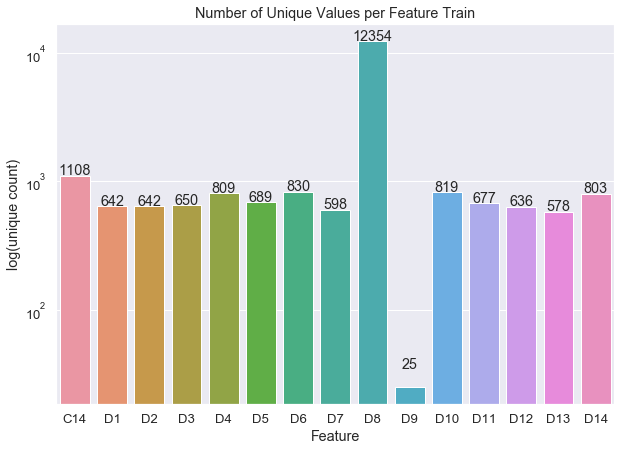

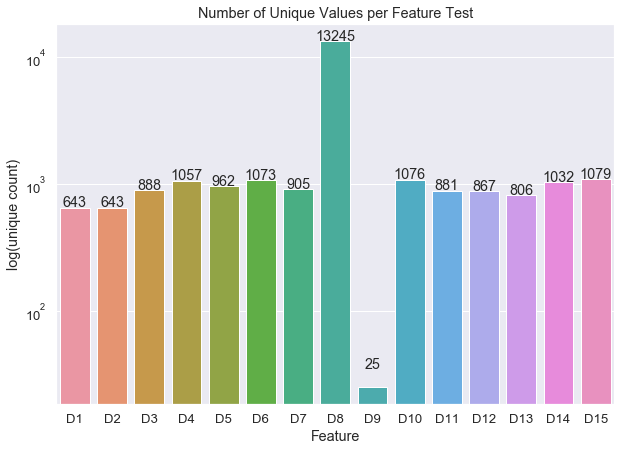

In [74]:
plt.figure(figsize=(10, 7))
d_features = list(train_transaction.columns[30:45])
uniques = [len(train_transaction[col].unique()) for col in d_features]
sns.set(font_scale=1.2)
ax = sns.barplot(d_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of Unique Values per Feature Train')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 
plt.figure(figsize=(10, 7))
d_features = list(test_transaction.columns[30:45])
uniques = [len(test_transaction[col].unique()) for col in d_features]
sns.set(font_scale=1.2)
ax = sns.barplot(d_features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='log(unique count)', title='Number of Unique Values per Feature Test')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 

### VISUALIZATION ON TRANSACTION AMOUNT

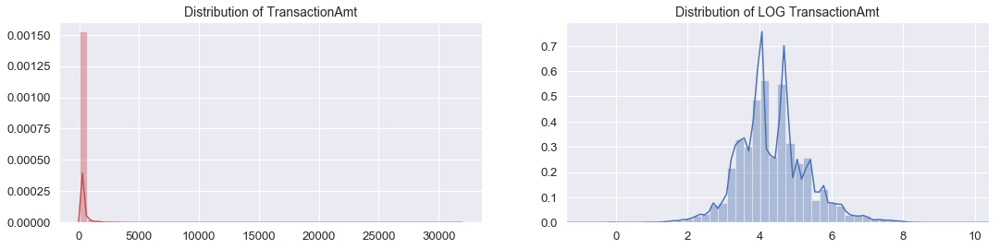

In [75]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction['TransactionAmt'].values

sns.distplot(time_val, ax=ax[0], color='r')
ax[0].set_title('Distribution of TransactionAmt', fontsize=14)
ax[1].set_xlim([min(time_val), max(time_val)])

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

plt.show()

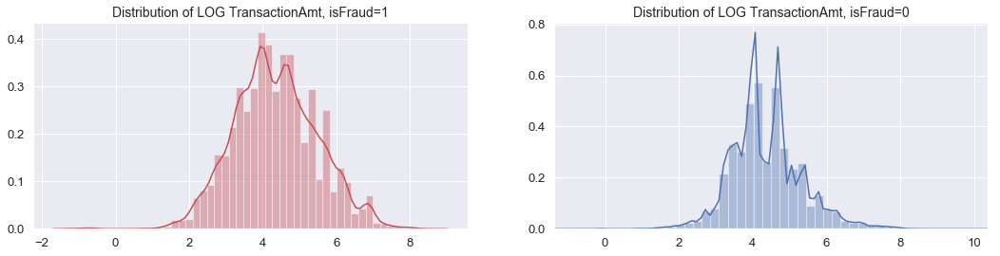

In [76]:
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = train_transaction.loc[train_transaction['isFraud'] == 1]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionAmt, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = train_transaction.loc[train_transaction['isFraud'] == 0]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

In [77]:
tmp = train_transaction[['TransactionAmt', 'isFraud']][0:100000]
plot_distribution(tmp[(tmp['TransactionAmt'] <= 800)], 'TransactionAmt', 'Transaction Amount Distribution', bins=10.0,)
del tmp

### VISUALIZATION DESCRIPTIVE

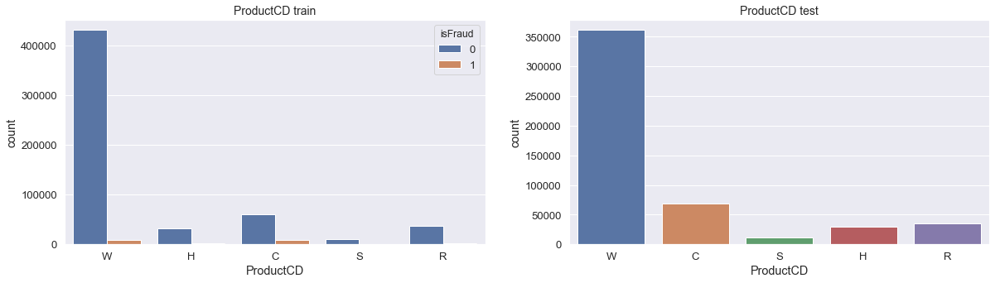

In [78]:
fig, ax = plt.subplots(1, 2, figsize=(20,5))
sns.countplot(x="ProductCD", ax=ax[0], hue = "isFraud", data=train_transaction)
ax[0].set_title('ProductCD train', fontsize=14)
sns.countplot(x="ProductCD", ax=ax[1], data=test_transaction)
ax[1].set_title('ProductCD test', fontsize=14)
plt.show()

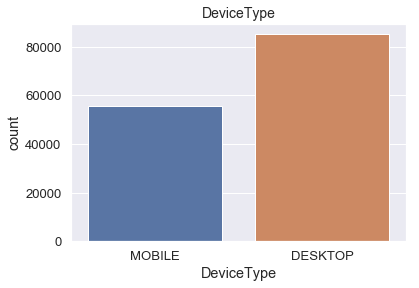

Unique Devices =  1779


WINDOWS        47722
IOS DEVICE     19782
MACOS          12573
TRIDENT/7.0     7440
RV:11.0         1901
Name: DeviceInfo, dtype: int64

In [79]:
upper_case_function(train_identity)
ax = sns.countplot(x="DeviceType", data=train_identity)
ax.set_title('DeviceType', fontsize=14)
plt.show()
print ("Unique Devices = ",train_identity['DeviceInfo'].nunique())
train_identity['DeviceInfo'].value_counts().head()

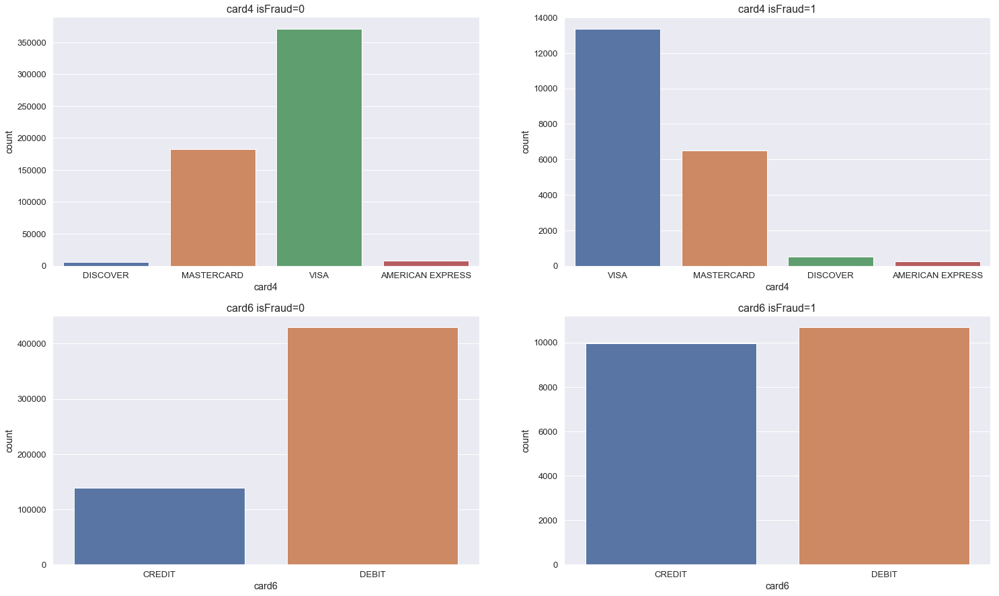

In [80]:
upper_case_function(train_transaction)
fig, (ax1,ax2) = plt.subplots(2,2 ,figsize=[25,15])
sns.countplot(x="card4", ax=ax1[0], data=train_transaction.loc[train_transaction['isFraud'] == 0])
ax1[0].set_title('card4 isFraud=0', fontsize=16)
sns.countplot(x="card4", ax=ax1[1], data=train_transaction.loc[train_transaction['isFraud'] == 1])
ax1[1].set_title('card4 isFraud=1', fontsize=16)
sns.countplot(x="card6", ax=ax2[0], data=train_transaction.loc[(train_transaction['isFraud'] == 0)&(train_transaction['card6'] != 'CHARGE CARD')&(train_transaction['card6'] != 'DEBIT OR CREDIT')])
ax2[0].set_title('card6 isFraud=0', fontsize=16)
sns.countplot(x="card6", ax=ax2[1], data=train_transaction.loc[train_transaction['isFraud'] == 1])
ax2[1].set_title('card6 isFraud=1', fontsize=16)
plt.show()

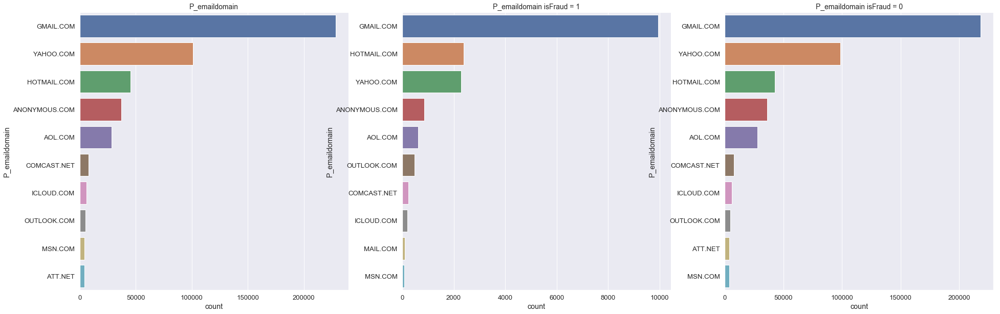

In [81]:
fig, ax = plt.subplots(1, 3, figsize=(32,10))
sns.countplot(y="P_emaildomain", ax=ax[0], data=train_transaction, order=train_transaction.P_emaildomain.value_counts().iloc[:10].index)
ax[0].set_title('P_emaildomain', fontsize=14)
sns.countplot(y="P_emaildomain", ax=ax[1], data=train_transaction.loc[train_transaction['isFraud'] == 1], order=train_transaction.loc[train_transaction['isFraud'] == 1].P_emaildomain.value_counts().iloc[:10].index)
ax[1].set_title('P_emaildomain isFraud = 1', fontsize=14)
sns.countplot(y="P_emaildomain", ax=ax[2], data=train_transaction.loc[train_transaction['isFraud'] == 0], order=train_transaction.loc[train_transaction['isFraud'] == 0].P_emaildomain.value_counts().iloc[:10].index)
ax[2].set_title('P_emaildomain isFraud = 0', fontsize=14)
plt.show()

# FEATURE ENGINEERING

In [82]:
test['V39_V51_V52_cor'] = test['V39'] + test['V51'] + test['V52']
test['V40_V51_V52_cor'] = test['V40'] + test['V51'] + test['V52']
test['V44_V86_V87_cor'] = test['V44'] + test['V86'] + test['V87']
test['V45_V86_V87_cor'] = test['V45'] + test['V86'] + test['V87']
test['V86_V190_V199_V246_V257_cor'] = test['V86'] + test['V190'] + test['V199'] + test['V246'] + test['V257']
test['V87_V257_cor'] = test['V87'] + test['V257']
test['V148_V149_V154_V155_V156_V157_V158_cor'] = test['V148'] + test['V149'] + test['V154'] + test['V155'] + test['V156']+ test['V157'] + test['V158']
test['V170_V171_V188_V200_V201_cor'] = test['V170'] + test['V171'] + test['V188'] + test['V200'] + test['V201']
test['V171_V189_V200_V201_cor'] = test['V171'] + test['V189'] + test['V200'] + test['V201']
test['V188_V189_V200_V201_V242_V244_cor'] = test['V188'] + test['V189'] + test['V200'] + test['V201'] + test['V242'] + test['V244']
test['V189_V200_V201_V242_V233_V244_cor'] = test['V189'] + test['V200'] + test['V201'] + test['V242'] + test['V243'] + test['V244']
test['V190_V199_V228_V233_cor'] = test['V190'] + test['V199'] + test['V228'] + test['V233']
test['V199_V228_V230_V246_V257_V258_cor'] = test['V199'] + test['V228'] + test['V230'] + test['V246'] + test['V257'] + test['V258']
test['V200_V201_V244_cor'] = test['V200'] + test['V201'] + test['V244']
test['V201_V242_V244_cor'] = test['V201'] + test['V242'] + test['V244']
test['V228_V230_V246_V257_V258_cor'] = test['V228'] + test['V230'] + test['V246'] + test['V257'] + test['V258']
test['V230_V246_V257_V258_cor'] = test['V230'] + test['V246'] + test['V257'] + test['V258']
test['V242_V243_V244_cor'] = test['V242'] + test['V243'] + test['V244']
test['V243_V244_cor'] = test['V243'] + test['V244']
test['V246_V257_V258_cor'] = test['V246'] + test['V257'] + test['V258']

In [83]:
train['V39_V51_V52_cor'] = train['V39'] + train['V51'] + train['V52']
train['V40_V51_V52_cor'] = train['V40'] + train['V51'] + train['V52']
train['V44_V86_V87_cor'] = train['V44'] + train['V86'] + train['V87']
train['V45_V86_V87_cor'] = train['V45'] + train['V86'] + train['V87']
train['V86_V190_V199_V246_V257_cor'] = train['V86'] + train['V190'] + train['V199'] + train['V246'] + train['V257']
train['V87_V257_cor'] = train['V87'] + train['V257']
train['V148_V149_V154_V155_V156_V157_V158_cor'] = train['V148'] + train['V149'] + train['V154'] + train['V155'] + train['V156']+ train['V157'] + train['V158']
train['V170_V171_V188_V200_V201_cor'] = train['V170'] + train['V171'] + train['V188'] + train['V200'] + train['V201']
train['V171_V189_V200_V201_cor'] = train['V171'] + train['V189'] + train['V200'] + train['V201']
train['V188_V189_V200_V201_V242_V244_cor'] = train['V188'] + train['V189'] + train['V200'] + train['V201'] + train['V242'] + train['V244']
train['V189_V200_V201_V242_V233_V244_cor'] = train['V189'] + train['V200'] + train['V201'] + train['V242'] + train['V243'] + train['V244']
train['V190_V199_V228_V233_cor'] = train['V190'] + train['V199'] + train['V228'] + train['V233']
train['V199_V228_V230_V246_V257_V258_cor'] = train['V199'] + train['V228'] + train['V230'] + train['V246'] + train['V257'] + train['V258']
train['V200_V201_V244_cor'] = train['V200'] + train['V201'] + train['V244']
train['V201_V242_V244_cor'] = train['V201'] + train['V242'] + train['V244']
train['V228_V230_V246_V257_V258_cor'] = train['V228'] + train['V230'] + train['V246'] + train['V257'] + train['V258']
train['V230_V246_V257_V258_cor'] = train['V230'] + train['V246'] + train['V257'] + train['V258']
train['V242_V243_V244_cor'] = train['V242'] + train['V243'] + train['V244']
train['V243_V244_cor'] = train['V243'] + train['V244']
train['V246_V257_V258_cor'] = train['V246'] + train['V257'] + train['V258']

In [24]:

train['uid'] = train['card1'].astype(str)+'_'+train['card2'].astype(str)
test['uid'] = test['card1'].astype(str)+'_'+test['card2'].astype(str)

train['uid2'] = train['uid'].astype(str)+'_'+train['card3'].astype(str)+'_'+train['card5'].astype(str)
test['uid2'] = test['uid'].astype(str)+'_'+test['card3'].astype(str)+'_'+test['card5'].astype(str)

train['uid3'] = train['uid2'].astype(str)+'_'+train['addr1'].astype(str)+'_'+train['addr2'].astype(str)
test['uid3'] = test['uid2'].astype(str)+'_'+test['addr1'].astype(str)+'_'+test['addr2'].astype(str)

train['TransactionAmt_check'] = np.where(train['TransactionAmt'].isin(test['TransactionAmt']), 1, 0)
test['TransactionAmt_check']  = np.where(test['TransactionAmt'].isin(train['TransactionAmt']), 1, 0)

# For our model current TransactionAmt is a noise
# https://www.kaggle.com/kyakovlev/ieee-check-noise
# (even if features importances are telling contrariwise)
# There are many unique values and model doesn't generalize well
# Lets do some aggregations
i_cols = ['card1','card2','card3','card5','uid','uid2','uid3']

for col in i_cols:
    for agg_type in ['mean','std']:
        new_col_name = col+'_TransactionAmt_'+agg_type
        temp_df = pd.concat([train[[col, 'TransactionAmt']], test[[col,'TransactionAmt']]])
        #temp_df['TransactionAmt'] = temp_df['TransactionAmt'].astype(int)
        temp_df = temp_df.groupby([col])['TransactionAmt'].agg([agg_type]).reset_index().rename(
                                                columns={agg_type: new_col_name})
        
        temp_df.index = list(temp_df[col])
        temp_df = temp_df[new_col_name].to_dict()   
    
        train[new_col_name] = train[col].map(temp_df)
        test[new_col_name]  = test[col].map(temp_df)
           
# Small "hack" to transform distribution 
# (doesn't affect auc much, but I like it more)
train['TransactionAmt'] = np.log1p(train['TransactionAmt'])
test['TransactionAmt'] = np.log1p(test['TransactionAmt']) 

In [84]:
START_DATE = '2019-01-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
train["Date"] = train['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

train['TransactionDT_Weekdays'] = train['Date'].dt.dayofweek
train['TransactionDT_Days'] = train['Date'].dt.day
train['TransactionDT_Hours'] = train['Date'].dt.hour

train.drop(columns='Date', inplace=True)

In [85]:
START_DATE = '2019-01-01'
startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")
test["Date"] = test['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

test['TransactionDT_Weekdays'] = test['Date'].dt.dayofweek
test['TransactionDT_Days'] = test['Date'].dt.day
test['TransactionDT_Hours'] = test['Date'].dt.hour

test.drop(columns='Date', inplace=True)

In [86]:
def change_value_P_emaildomain(x) :
    if x in ['gmail.com', 'icloud.com', 'mail.com' , 'outlook.es', 'protonmail.com'] :
        return x
    else :
        return 'NaN'
    
train.loc[:,'P_emaildomain'] = train['P_emaildomain'].apply(lambda x : change_value_P_emaildomain(x))

In [87]:
test.loc[:,'P_emaildomain'] = test['P_emaildomain'].apply(lambda x : change_value_P_emaildomain(x))

In [88]:
def change_value_R_emaildomain(x) :
    if x in ['gmail.com', 'icloud.com', 'mail.com', 'netzero.net', 'outlook.com', 'outlook.es', 'protonmail.com'] :
        return x
    else :
        return 'NaN'
    
train.loc[:,'R_emaildomain'] = train['R_emaildomain'].apply(lambda x : change_value_R_emaildomain(x))

In [89]:
test.loc[:,'R_emaildomain'] = test['R_emaildomain'].apply(lambda x : change_value_R_emaildomain(x))

In [90]:
def change_value_id_30(x) :
    if x in ['Android 4.4.2', 'Android 5.1.1' 'iOS 11.0.1' 'iOS 11.1.0', 'iOS 11.4.0', 'other'] :
        return x
    else :
        return 'NaN'

train.loc[:,'id_30'] = train['id_30'].apply(lambda x : change_value_id_30(x))

In [91]:
test.loc[:,'id_30'] = test['id_30'].apply(lambda x : change_value_id_30(x))

In [92]:
def change_value_id_31(x) :
    if x in ['Lanix/Ilium', 'Mozilla/Firefox' 'comodo' 'icedragon', 'opera', 'opera generic'] :
        return x
    else :
        return 'NaN'

train.loc[:,'id_31'] = train['id_31'].apply(lambda x : change_value_id_31(x))

In [93]:
test.loc[:,'id_31'] = test['id_31'].apply(lambda x : change_value_id_31(x))

In [94]:
def change_value_id_33(x) :
    if x in ['1024x552', '1364x768' '1440x759' '1916x901', '1920x975', '2076x1080', '640x360'] :
        return x
    else :
        return 'NaN'

train.loc[:,'id_33'] = train['id_33'].apply(lambda x : change_value_id_33(x))

In [95]:
test.loc[:,'id_33'] = test['id_33'].apply(lambda x : change_value_id_33(x))

In [96]:
from tqdm import tqdm_notebook

tmp = 100*train[train.index < 590540]['isFraud'].groupby(train['DeviceInfo']).sum()/train[train.index < 590540]['isFraud'].groupby(train['DeviceInfo']).count()

Device_Info = []

for i in tqdm_notebook(range(len(tmp))) :
    if tmp[i] == 100.0 :
        Device_Info.append(tmp.index[i])

def change_value_DeviceInfo(x) :
    if x in Device_Info :
        return x
    else :
        return 'NaN'

train.loc[:,'DeviceInfo'] = train['DeviceInfo'].apply(lambda x : change_value_DeviceInfo(x))

In [97]:
test.loc[:,'DeviceInfo'] = test['DeviceInfo'].apply(lambda x : change_value_DeviceInfo(x))

### MEMORY REDUCTION AND DATA SPLIT
Due to the size of the file we have decided to use a memory reduction method. This should help with the speed of our model with the trade off of accuracy

In [98]:
%%time
#Pre-Processing
pre_processing_encoder(train)
pre_processing_encoder(test)

Successfully Converted 31 columns
Label Binarizer:5 
Label Encoder:26
Successfully Converted 31 columns
Label Binarizer:5 
Label Encoder:26
Wall time: 1min 58s


In [99]:
X = train.drop(columns=['isFraud']).fillna(-1)
Y = train['isFraud']
X_train, X_test, y_train, y_test = train_test_split(X, Y, stratify=Y, random_state=66, test_size=0.25)

In [100]:
%%time
X_train = reduce_mem_usage2(X_train)
X_test = reduce_mem_usage2(X_test)
test = reduce_mem_usage2(test)

Memory usage of dataframe is 1491.87 MB
Memory usage after optimization is: 413.94 MB
Decreased by 72.3%
Memory usage of dataframe is 497.29 MB
Memory usage after optimization is: 133.19 MB
Decreased by 73.2%
Memory usage of dataframe is 1706.73 MB
Memory usage after optimization is: 481.29 MB
Decreased by 71.8%
Wall time: 4min 33s


In [101]:
drop_col = ['TransactionDT']
X_train.drop(drop_col,axis=1, inplace=True)
X_test.drop(drop_col, axis=1, inplace=True)
test.drop(drop_col, axis=1, inplace=True)
X_train.head()

,TransactionID,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,V200_V201_V244_cor,V201_V242_V244_cor,V228_V230_V246_V257_V258_cor,V230_V246_V257_V258_cor,V242_V243_V244_cor,V243_V244_cor,V246_V257_V258_cor,TransactionDT_Weekdays,TransactionDT_Days,TransactionDT_Hours
541821,3528821,185.0000,4,12063,115.0,150.0,4,226.0,2,325.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,5,15,12
16431,3003431,107.9375,4,15185,332.0,150.0,4,226.0,2,264.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,6,6,1
49794,3036794,335.0000,4,4921,475.0,150.0,4,226.0,2,184.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,14,17
559788,3546788,57.9375,4,3343,513.0,150.0,2,224.0,2,315.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,4,21,16
572918,3559918,664.0000,4,12002,111.0,150.0,2,224.0,2,203.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2,26,0


In [102]:
%%time
X_train.fillna(-1,inplace=True)
X_test.fillna(-1,inplace=True)
test.fillna(-1,inplace=True)
X_test.head()

Wall time: 1.14 s


## SMOTE (Oversampling/Undersampling)

In [123]:
from imblearn.combine import SMOTETomek
smote_enn = SMOTETomek(ratio='auto')
X_train_np, y_train_np = smote_enn.fit_sample(X_train, y_train)

In [124]:
X_train = pd.DataFrame(X_train_np, columns=X_train.columns)
y_train = pd.Series(y_train_np)

# MACHINE LEARNING

####Models Used:

*   Principal Component Analysis
*   Logistic Regression
*   XGBoost
*   LightGBM
*   Desicion Tree
*   Random Forest
*   Deep Learning Model


## PCA MODEL

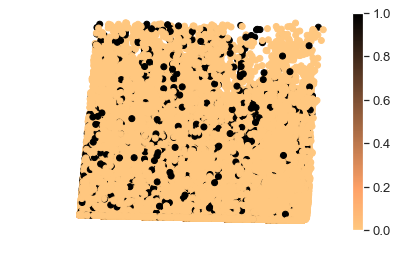

In [44]:
# No StandardScaler
PCA_train_x = PCA(2).fit_transform(X_train)
plt.scatter(PCA_train_x[:, 0], PCA_train_x[:, 1], c=y_train, cmap="copper_r")
plt.axis('off')
plt.colorbar()
plt.show()

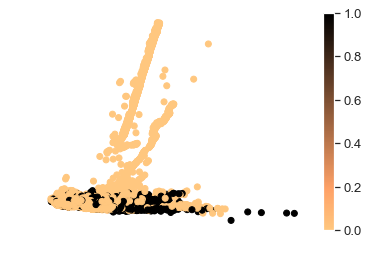

In [45]:
# W/ StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  
X_test_scaled = scaler.fit_transform(X_test)         

PCA_train_x = PCA(2).fit_transform(X_train_scaled)
PCA_test_x = PCA(2).fit_transform(X_test_scaled)

plt.scatter(PCA_train_x[:, 0], PCA_train_x[:, 1], c=y_train, cmap="copper_r")
plt.axis('off')
plt.colorbar()
plt.show()

## LOGISTIC REGRESSION

In our model we have created a penality weight using the least common square method. During this we will loop through multiple weights to see how the model behaves. 

In [49]:
list_penalty = []
list_train = []
list_test = []
for x in range(1,21):
  logreg = LogisticRegression(solver='lbfgs')
  penalty = 0.05*x
  weight_1 = (1-penalty)*y_train
  weight_0 = (1-y_train)*penalty
  weights = weight_1+weight_0
  logreg.fit(PCA_train_x, y_train, sample_weight=weights)
  list_penalty.append(penalty)
  list_train.append(logreg.score(PCA_train_x, y_train))
  list_test.append(logreg.score(PCA_test_x, y_test))

In [50]:
# Create a dataframe to put the results in
pd.DataFrame(list(zip(list_penalty, list_train, list_test)))

,0,1,2
0,0.05,0.773534,0.821424
1,0.10,0.958637,0.957869
2,0.15,0.962669,0.962617
3,0.20,0.963098,0.963078
4,0.25,0.963893,0.963633
5,0.30,0.964575,0.964229
6,0.35,0.964857,0.964859
7,0.40,0.964920,0.964968
8,0.45,0.964938,0.964981
9,0.50,0.964963,0.965002


In [51]:
test_score=logreg.score(PCA_test_x, y_test)
print('Test accuracy is ', test_score)

Test accuracy is  0.9650082974904325


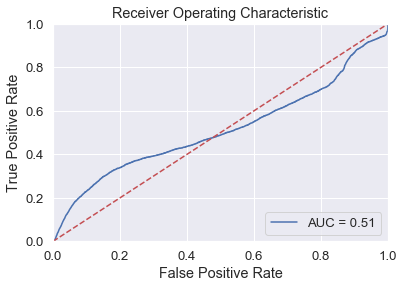

In [52]:
import sklearn.metrics as metrics
# calculate the fpr and tpr for all thresholds of the classification
probs = logreg.predict_proba(PCA_test_x)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
import matplotlib.pyplot as plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## XGBOOST

In [46]:
xgb.XGBClassifier(
        n_estimators=500,
        max_depth=9,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        gamma = 0.1,
        alpha = 4,
        missing = -1,
        tree_method='gpu_hist'
)

XGBClassifier(alpha=4, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, gamma=0.1,
              learning_rate=0.05, max_delta_step=0, max_depth=9,
              min_child_weight=1, missing=-1, n_estimators=500, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.9, tree_method='gpu_hist', verbosity=1)

In [47]:
%%time
NFOLDS = 10
kf = StratifiedKFold(n_splits=NFOLDS, shuffle=True, random_state=123)

y_preds = np.zeros(X_test.shape[0])
y_oof = np.zeros(X_train.shape[0])
score = 0
  
for fold, (tr_idx, val_idx) in enumerate(kf.split(X_train, y_train)):
    clf = xgb.XGBClassifier(
                n_estimators=100,
                max_depth=4,
                learning_rate=0.05,
                subsample=0.9,
                colsample_bytree=0.9,
                gamma = 0.2,
                alpha = 4,
                missing = -1,
                tree_method='gpu_hist'
                )
    
    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]
    clf.fit(X_tr, y_tr)
    y_pred_train = clf.predict_proba(X_vl)[:,1]
    y_oof[val_idx] = y_pred_train
    print("FOLD: ",fold,' AUC {}'.format(roc_auc_score(y_vl, y_pred_train)))
    score += roc_auc_score(y_vl, y_pred_train) / NFOLDS
    y_preds+= clf.predict_proba(X_test)[:,1] / NFOLDS
    
    del X_tr, X_vl, y_tr, y_vl
    gc.collect()
    
    
print("\nMEAN AUC = {}".format(score))
print("OOF AUC = {}".format(roc_auc_score(y_train, y_oof)))

FOLD:  0  AUC 0.8888045851569581
FOLD:  1  AUC 0.8854268055678199
FOLD:  2  AUC 0.8843099131981002
FOLD:  3  AUC 0.893159080462893
FOLD:  4  AUC 0.8850888057172571
FOLD:  5  AUC 0.8680229076711868
FOLD:  6  AUC 0.8868366779348378
FOLD:  7  AUC 0.881505986884021
FOLD:  8  AUC 0.8855122464928995
FOLD:  9  AUC 0.8865991176398619

MEAN AUC = 0.8845266126725837
OOF AUC = 0.8844852836480396
Wall time: 3min 49s


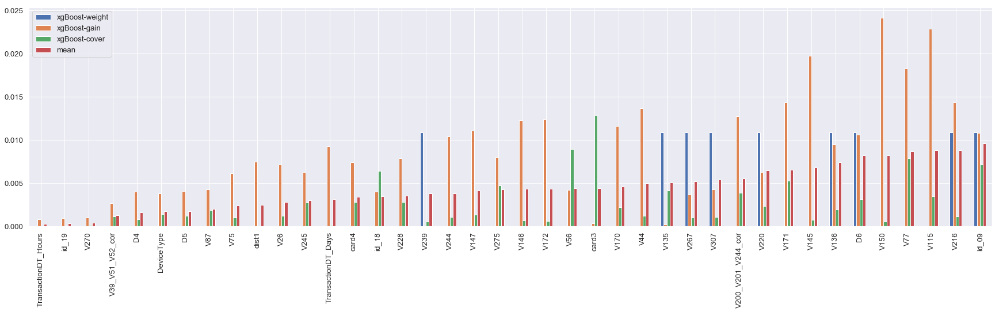

In [52]:
# Get xgBoost importances
importance_dict = {}
for import_type in ['weight', 'gain', 'cover']:
    importance_dict['xgBoost-'+import_type] = clf.get_booster().get_score(importance_type=import_type)
    
# MinMax scale all importances
importance_df = pd.DataFrame(importance_dict).fillna(0)
importance_df = pd.DataFrame(
    preprocessing.MinMaxScaler().fit_transform(importance_df),
    columns=importance_df.columns,
    index=importance_df.index
)

# Create mean column
importance_df['mean'] = importance_df.mean(axis=1)

# Plot the feature importances
importance_df.sort_values('mean').head(40).plot(kind='bar', figsize=(30, 7))

In [53]:
y_preds = clf.predict_proba(test)[:,1]

In [54]:
y_preds.shape

(506691,)

In [55]:
sub = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/sample_submission.csv', index_col='TransactionID')
sub['isFraud'] = y_preds
sub.to_csv('XGBoostResults.csv')
sub.head()

,isFraud
TransactionID,
3663549,0.009068
3663550,0.018663
3663551,0.023354
3663552,0.006870
3663553,0.012884


In [56]:
# del clf
# gc.collect()

Predicted 0 frauds


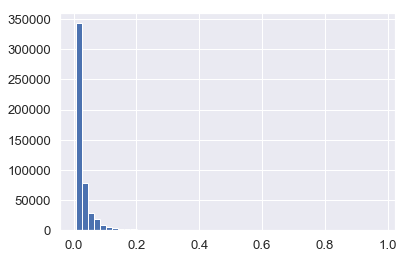

In [57]:
sub.loc[ sub['isFraud']>0.99 , 'isFraud'] = 1
b = plt.hist(sub['isFraud'], bins=50)
print ("Predicted {} frauds".format(int(sub[sub['isFraud']==1].sum())))

In [58]:
print ("Predicted {} frauds".format(int(sub[sub['isFraud']==1].sum())))

Predicted 0 frauds


In [59]:
# eval_set = [(X_train, y_train), (X_test, y_test)]
# eval_metric = ["auc","error"]
# %time clf.fit(X_train, y_train, eval_metric=eval_metric, eval_set=eval_set, verbose=True)

In [63]:
# del sub, X_train, X_test, importance_df
# gc.collect()

## LIGHTGBM 
This is our star model

In [103]:
%%time
import cmake
params = {'num_leaves': 100,
          'min_child_weight': 0.03,
          'feature_fraction': 0.35,
          'bagging_fraction': 0.35,
          'min_data_in_leaf': 100,
          'objective': 'binary',
          'max_depth': 15,
          'learning_rate': 0.015,
          "boosting_type": "gbdt",
          "bagging_seed": 10,
          "metric": 'auc',
          "verbosity": -1,
          'reg_alpha': 0.2,
          'reg_lambda': 0.6,
          'random_state': 50,
          'device': 'cpu',
          'gpu_platform_id': 1,
          'gpu_device_id': 0
         }


dtrain = lgb.Dataset(X_train, label=y_train)
dvalid = lgb.Dataset(X_test, label=y_test)

model = lgb.train(params, dtrain, 10000, valid_sets = [dtrain, dvalid], verbose_eval=50, early_stopping_rounds=50)
    

prediction_LGB = model.predict(test)
# prediction_val_LGB = model.predict(X_val)

Training until validation scores don't improve for 50 rounds.
[50]	training's auc: 0.897551	valid_1's auc: 0.889894
[100]	training's auc: 0.897654	valid_1's auc: 0.890229
[150]	training's auc: 0.898037	valid_1's auc: 0.890553
Early stopping, best iteration is:
[143]	training's auc: 0.898071	valid_1's auc: 0.890674
Wall time: 2min 53s


In [104]:
sub_light = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/sample_submission.csv', index_col='TransactionID')
sub_light['isFraud'] = prediction_LGB
sub_light.to_csv('LightGBMResults.csv')
sub_light.head()

,isFraud
TransactionID,
3663549,0.034648
3663550,0.034670
3663551,0.034756
3663552,0.034576
3663553,0.034598


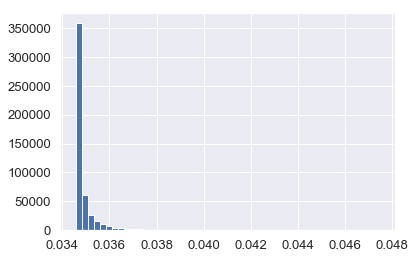

In [105]:
sub_light.loc[ sub_light['isFraud']>0.99 , 'isFraud'] = 1
p = plt.hist(sub_light['isFraud'], bins=50)

In [106]:
print ("Predicted {} frauds".format(int(sub_light[sub_light['isFraud']==1].sum())))

Predicted 0 frauds


## DECISION TREE 

In [107]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [108]:
DecisionTree_predictions = dtree.predict_proba(test)

In [109]:
sub_Dtree = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/sample_submission.csv', index_col='TransactionID')
sub_Dtree['isFraud'] = DecisionTree_predictions
sub_Dtree.to_csv('DecisionTreeResults.csv')
sub_Dtree.head()

,isFraud
TransactionID,
3663549,0.0
3663550,0.0
3663551,0.0
3663552,0.0
3663553,0.0


<BarContainer object of 455 artists>

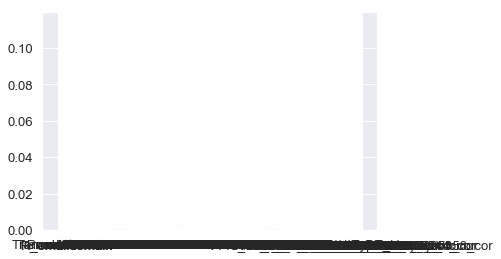

In [110]:
dtree.feature_importances_
plt.bar(X_train.columns, dtree.feature_importances_)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.120429 to fit



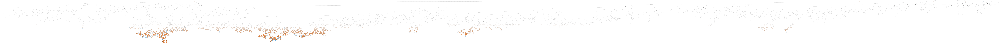

In [111]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## RANDOM FOREST

In [112]:
rfc = RandomForestClassifier(n_estimators=1000)
rfc.fit(X_train, y_train)
rfc_pred = rfc.predict_proba(test)

In [113]:
sub_rfc = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/sample_submission.csv', index_col='TransactionID')
sub_rfc['isFraud'] = rfc_pred
sub_rfc.to_csv('RandomforesrResults.csv')
sub_rfc.head()

,isFraud
TransactionID,
3663549,0.937
3663550,0.916
3663551,0.880
3663552,0.976
3663553,0.980


## DEEP LEARNING MODEL

In [114]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Input, Dense
from keras import regularizers
from keras.models import Model, load_model
from keras.callbacks import ModelCheckpoint, TensorBoard

Using TensorFlow backend.


In [117]:
Dclf = Sequential([
    Dense(units=16, kernel_initializer='uniform', input_dim=455, activation='relu'),
    Dense(units=18, kernel_initializer='uniform', activation='relu'),
    Dropout(0.25),
    Dense(20, kernel_initializer='uniform', activation='relu'),
    Dense(24, kernel_initializer='uniform', activation='relu'),
    Dense(1, kernel_initializer='uniform', activation='sigmoid')
])

Dclf.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
nb_epoch = 10
batch_size = 32
Dclf.fit(X_train, y_train, batch_size=batch_size, epochs=nb_epoch)


Epoch 1/10


169504/442905 [==========>...................] - ETA: 1:34:32 - loss: 1.1505e-04 - acc: 1.00 - ETA: 3:32 - loss: 0.4869 - acc: 0.9698       - ETA: 2:08 - loss: 0.5678 - acc: 0.964 - ETA: 1:36 - loss: 0.5729 - acc: 0.964 - ETA: 1:21 - loss: 0.5379 - acc: 0.966 - ETA: 1:09 - loss: 0.5075 - acc: 0.968 - ETA: 1:02 - loss: 0.4941 - acc: 0.969 - ETA: 56s - loss: 0.4902 - acc: 0.969 - ETA: 52s - loss: 0.4966 - acc: 0.96 - ETA: 49s - loss: 0.5227 - acc: 0.96 - ETA: 47s - loss: 0.5283 - acc: 0.96 - ETA: 45s - loss: 0.5449 - acc: 0.96 - ETA: 42s - loss: 0.5674 - acc: 0.96 - ETA: 41s - loss: 0.5627 - acc: 0.96 - ETA: 39s - loss: 0.5673 - acc: 0.96 - ETA: 38s - loss: 0.5744 - acc: 0.96 - ETA: 37s - loss: 0.5672 - acc: 0.96 - ETA: 37s - loss: 0.5705 - acc: 0.96 - ETA: 36s - loss: 0.5699 - acc: 0.96 - ETA: 35s - loss: 0.5681 - acc: 0.96 - ETA: 35s - loss: 0.5708 - acc: 0.96 - ETA: 34s - loss: 0.5715 - acc: 0.96 - ETA: 33s - loss: 0.5733 - acc: 0.96 - ETA: 33s - loss: 0.5587 - acc: 0.96 - ETA: 32s - 

367008/442905 [=======================>......] - ETA: 18s - loss: 0.2017 - acc: 0.96 - ETA: 18s - loss: 0.2016 - acc: 0.96 - ETA: 18s - loss: 0.2013 - acc: 0.96 - ETA: 18s - loss: 0.2011 - acc: 0.96 - ETA: 17s - loss: 0.2009 - acc: 0.96 - ETA: 17s - loss: 0.2006 - acc: 0.96 - ETA: 17s - loss: 0.2003 - acc: 0.96 - ETA: 17s - loss: 0.1999 - acc: 0.96 - ETA: 17s - loss: 0.1997 - acc: 0.96 - ETA: 17s - loss: 0.1994 - acc: 0.96 - ETA: 17s - loss: 0.1990 - acc: 0.96 - ETA: 17s - loss: 0.1988 - acc: 0.96 - ETA: 17s - loss: 0.1986 - acc: 0.96 - ETA: 17s - loss: 0.1983 - acc: 0.96 - ETA: 17s - loss: 0.1981 - acc: 0.96 - ETA: 17s - loss: 0.1979 - acc: 0.96 - ETA: 17s - loss: 0.1975 - acc: 0.96 - ETA: 17s - loss: 0.1970 - acc: 0.96 - ETA: 17s - loss: 0.1966 - acc: 0.96 - ETA: 17s - loss: 0.1964 - acc: 0.96 - ETA: 16s - loss: 0.1962 - acc: 0.96 - ETA: 16s - loss: 0.1961 - acc: 0.96 - ETA: 16s - loss: 0.1958 - acc: 0.96 - ETA: 16s - loss: 0.1956 - acc: 0.96 - ETA: 16s - loss: 0.1954 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1703 - acc: 0.964 - ETA: 4s - loss: 0.1701 - acc: 0.964 - ETA: 4s - loss: 0.1700 - acc: 0.964 - ETA: 4s - loss: 0.1699 - acc: 0.964 - ETA: 4s - loss: 0.1699 - acc: 0.964 - ETA: 4s - loss: 0.1699 - acc: 0.964 - ETA: 4s - loss: 0.1698 - acc: 0.964 - ETA: 4s - loss: 0.1698 - acc: 0.964 - ETA: 4s - loss: 0.1697 - acc: 0.964 - ETA: 4s - loss: 0.1696 - acc: 0.964 - ETA: 4s - loss: 0.1695 - acc: 0.964 - ETA: 3s - loss: 0.1694 - acc: 0.964 - ETA: 3s - loss: 0.1693 - acc: 0.964 - ETA: 3s - loss: 0.1693 - acc: 0.964 - ETA: 3s - loss: 0.1692 - acc: 0.964 - ETA: 3s - loss: 0.1692 - acc: 0.964 - ETA: 3s - loss: 0.1691 - acc: 0.964 - ETA: 3s - loss: 0.1690 - acc: 0.964 - ETA: 3s - loss: 0.1689 - acc: 0.964 - ETA: 3s - loss: 0.1688 - acc: 0.964 - ETA: 3s - loss: 0.1687 - acc: 0.964 - ETA: 3s - loss: 0.1687 - acc: 0.964 - ETA: 3s - loss: 0.1686 - acc: 0.964 - ETA: 3s - loss: 0.1686 - acc: 0.964 - ETA: 3s - loss: 0.1685 - acc: 0.964 - E

178720/442905 [===========>..................] - ETA: 4:08 - loss: 0.2036 - acc: 0.937 - ETA: 33s - loss: 0.1624 - acc: 0.958 - ETA: 28s - loss: 0.1441 - acc: 0.96 - ETA: 27s - loss: 0.1398 - acc: 0.96 - ETA: 26s - loss: 0.1455 - acc: 0.96 - ETA: 26s - loss: 0.1416 - acc: 0.96 - ETA: 27s - loss: 0.1442 - acc: 0.96 - ETA: 26s - loss: 0.1438 - acc: 0.96 - ETA: 26s - loss: 0.1428 - acc: 0.96 - ETA: 26s - loss: 0.1425 - acc: 0.96 - ETA: 26s - loss: 0.1405 - acc: 0.96 - ETA: 26s - loss: 0.1446 - acc: 0.96 - ETA: 26s - loss: 0.1419 - acc: 0.96 - ETA: 26s - loss: 0.1432 - acc: 0.96 - ETA: 26s - loss: 0.1429 - acc: 0.96 - ETA: 26s - loss: 0.1423 - acc: 0.96 - ETA: 26s - loss: 0.1460 - acc: 0.96 - ETA: 25s - loss: 0.1453 - acc: 0.96 - ETA: 25s - loss: 0.1449 - acc: 0.96 - ETA: 25s - loss: 0.1448 - acc: 0.96 - ETA: 25s - loss: 0.1440 - acc: 0.96 - ETA: 25s - loss: 0.1440 - acc: 0.96 - ETA: 25s - loss: 0.1462 - acc: 0.96 - ETA: 25s - loss: 0.1457 - acc: 0.96 - ETA: 25s - loss: 0.1463 - acc: 0.96 

365856/442905 [=======================>......] - ETA: 16s - loss: 0.1448 - acc: 0.96 - ETA: 16s - loss: 0.1449 - acc: 0.96 - ETA: 16s - loss: 0.1450 - acc: 0.96 - ETA: 16s - loss: 0.1451 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 15s - loss: 0.1447 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 15s - loss: 0.1451 - acc: 0.96 - ETA: 14s - loss: 0.1451 - acc: 0.96 - ETA: 14s - loss: 0.1451 - acc: 0.96 - ETA: 14s - loss: 0.1451 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1453 - acc: 0.964 - ETA: 4s - loss: 0.1453 - acc: 0.964 - ETA: 4s - loss: 0.1453 - acc: 0.964 - ETA: 4s - loss: 0.1452 - acc: 0.964 - ETA: 4s - loss: 0.1451 - acc: 0.964 - ETA: 4s - loss: 0.1451 - acc: 0.964 - ETA: 4s - loss: 0.1451 - acc: 0.964 - ETA: 4s - loss: 0.1450 - acc: 0.964 - ETA: 4s - loss: 0.1449 - acc: 0.964 - ETA: 4s - loss: 0.1449 - acc: 0.964 - ETA: 4s - loss: 0.1450 - acc: 0.964 - ETA: 4s - loss: 0.1449 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.965 - ETA: 3s - loss: 0.1448 - acc: 0.965 - ETA: 3s - loss: 0.1448 - acc: 0.965 - ETA: 3s - loss: 0.1448 - acc: 0.965 - ETA: 3s - loss: 0.1449 - acc: 0.965 - ETA: 3s - loss: 0.1449 - acc: 0.965 - ETA: 3s - loss: 0.1449 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.965 - ETA: 3s - loss: 0.1450 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.964 - ETA: 3s - loss: 0.1449 - acc: 0.964 - E

184320/442905 [===========>..................] - ETA: 4:49 - loss: 0.2627 - acc: 0.937 - ETA: 41s - loss: 0.1833 - acc: 0.953 - ETA: 36s - loss: 0.1748 - acc: 0.95 - ETA: 32s - loss: 0.1739 - acc: 0.95 - ETA: 29s - loss: 0.1648 - acc: 0.95 - ETA: 28s - loss: 0.1656 - acc: 0.96 - ETA: 27s - loss: 0.1567 - acc: 0.96 - ETA: 27s - loss: 0.1584 - acc: 0.96 - ETA: 27s - loss: 0.1550 - acc: 0.96 - ETA: 26s - loss: 0.1586 - acc: 0.96 - ETA: 27s - loss: 0.1584 - acc: 0.96 - ETA: 26s - loss: 0.1547 - acc: 0.96 - ETA: 26s - loss: 0.1525 - acc: 0.96 - ETA: 26s - loss: 0.1525 - acc: 0.96 - ETA: 26s - loss: 0.1522 - acc: 0.96 - ETA: 26s - loss: 0.1524 - acc: 0.96 - ETA: 26s - loss: 0.1531 - acc: 0.96 - ETA: 25s - loss: 0.1533 - acc: 0.96 - ETA: 25s - loss: 0.1518 - acc: 0.96 - ETA: 25s - loss: 0.1522 - acc: 0.96 - ETA: 25s - loss: 0.1513 - acc: 0.96 - ETA: 25s - loss: 0.1504 - acc: 0.96 - ETA: 25s - loss: 0.1512 - acc: 0.96 - ETA: 25s - loss: 0.1514 - acc: 0.96 - ETA: 25s - loss: 0.1510 - acc: 0.96 

375520/442905 [========================>.....] - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 15s - loss: 0.1448 - acc: 0.96 - ETA: 15s - loss: 0.1449 - acc: 0.96 - ETA: 15s - loss: 0.1450 - acc: 0.96 - ETA: 14s - loss: 0.1451 - acc: 0.96 - ETA: 14s - loss: 0.1451 - acc: 0.96 - ETA: 14s - loss: 0.1449 - acc: 0.96 - ETA: 14s - loss: 0.1449 - acc: 0.96 - ETA: 14s - loss: 0.1449 - acc: 0.96 - ETA: 14s - loss: 0.1446 - acc: 0.96 - ETA: 14s - loss: 0.1445 - acc: 0.96 - ETA: 14s - loss: 0.1445 - acc: 0.96 - ETA: 14s - loss: 0.1444 - acc: 0.96 - ETA: 14s - loss: 0.1442 - acc: 0.96 - ETA: 14s - loss: 0.1444 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - ETA: 14s - loss: 0.1444 - acc: 0.96 - ETA: 14s - loss: 0.1443 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1479 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1480 - acc: 0.964 - ETA: 3s - loss: 0.1482 - acc: 0.964 - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 3s - loss: 0.1481 - acc: 0.964 - ETA: 2s - loss: 0.1481 - acc: 0.964 - ETA: 2s - loss: 0.1481 - acc: 0.964 - ETA: 2s - loss: 0.1481 - acc: 0.964 - ETA: 2s - loss: 0.1482 - acc: 0.964 - ETA: 2s - loss: 0.1481 - acc: 0.965 - ETA: 2s - loss: 0.1481 - acc: 0.965 - ETA: 2s - loss: 0.1481 - acc: 0.965 - E

184000/442905 [===========>..................] - ETA: 5:44 - loss: 0.1399 - acc: 0.968 - ETA: 41s - loss: 0.1632 - acc: 0.961 - ETA: 35s - loss: 0.1478 - acc: 0.96 - ETA: 33s - loss: 0.1589 - acc: 0.96 - ETA: 30s - loss: 0.1594 - acc: 0.96 - ETA: 31s - loss: 0.1607 - acc: 0.96 - ETA: 31s - loss: 0.1632 - acc: 0.96 - ETA: 30s - loss: 0.1586 - acc: 0.96 - ETA: 29s - loss: 0.1544 - acc: 0.96 - ETA: 28s - loss: 0.1541 - acc: 0.96 - ETA: 28s - loss: 0.1573 - acc: 0.96 - ETA: 27s - loss: 0.1553 - acc: 0.96 - ETA: 27s - loss: 0.1506 - acc: 0.96 - ETA: 27s - loss: 0.1541 - acc: 0.96 - ETA: 27s - loss: 0.1535 - acc: 0.96 - ETA: 26s - loss: 0.1542 - acc: 0.96 - ETA: 26s - loss: 0.1534 - acc: 0.96 - ETA: 26s - loss: 0.1547 - acc: 0.96 - ETA: 26s - loss: 0.1532 - acc: 0.96 - ETA: 26s - loss: 0.1531 - acc: 0.96 - ETA: 26s - loss: 0.1545 - acc: 0.96 - ETA: 26s - loss: 0.1545 - acc: 0.96 - ETA: 26s - loss: 0.1538 - acc: 0.96 - ETA: 26s - loss: 0.1527 - acc: 0.96 - ETA: 25s - loss: 0.1531 - acc: 0.96 

369792/442905 [========================>.....] - ETA: 15s - loss: 0.1515 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1520 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1529 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - ETA: 3s - loss: 0.1530 - acc: 0.965 - E

186144/442905 [===========>..................] - ETA: 4:22 - loss: 0.0356 - acc: 1.000 - ETA: 38s - loss: 0.1464 - acc: 0.971 - ETA: 32s - loss: 0.1487 - acc: 0.96 - ETA: 31s - loss: 0.1620 - acc: 0.96 - ETA: 28s - loss: 0.1531 - acc: 0.96 - ETA: 27s - loss: 0.1530 - acc: 0.96 - ETA: 27s - loss: 0.1642 - acc: 0.96 - ETA: 27s - loss: 0.1636 - acc: 0.96 - ETA: 26s - loss: 0.1600 - acc: 0.96 - ETA: 26s - loss: 0.1532 - acc: 0.96 - ETA: 26s - loss: 0.1516 - acc: 0.96 - ETA: 26s - loss: 0.1497 - acc: 0.96 - ETA: 26s - loss: 0.1474 - acc: 0.96 - ETA: 26s - loss: 0.1492 - acc: 0.96 - ETA: 25s - loss: 0.1484 - acc: 0.96 - ETA: 25s - loss: 0.1486 - acc: 0.96 - ETA: 26s - loss: 0.1502 - acc: 0.96 - ETA: 25s - loss: 0.1498 - acc: 0.96 - ETA: 25s - loss: 0.1510 - acc: 0.96 - ETA: 25s - loss: 0.1515 - acc: 0.96 - ETA: 25s - loss: 0.1503 - acc: 0.96 - ETA: 25s - loss: 0.1486 - acc: 0.96 - ETA: 25s - loss: 0.1489 - acc: 0.96 - ETA: 25s - loss: 0.1490 - acc: 0.96 - ETA: 25s - loss: 0.1474 - acc: 0.96 

373504/442905 [========================>.....] - ETA: 15s - loss: 0.1525 - acc: 0.96 - ETA: 15s - loss: 0.1525 - acc: 0.96 - ETA: 15s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1524 - acc: 0.96 - ETA: 14s - loss: 0.1522 - acc: 0.96 - ETA: 14s - loss: 0.1522 - acc: 0.96 - ETA: 14s - loss: 0.1523 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1526 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1528 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1528 - acc: 0.96 - ETA: 14s - loss: 0.1526 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1526 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1524 - acc: 0.96 - ETA: 14s - loss: 0.1523 - acc: 0.96 - ETA: 13s - loss: 0.1523 - acc: 0.96 - ETA: 13s - loss: 0.1523 - acc: 0.96 - ETA: 13s - loss: 0.1521 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.964 - ETA: 2s - loss: 0.1527 - acc: 0.964 - ETA: 2s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.965 - E

191168/442905 [===========>..................] - ETA: 4:36 - loss: 0.0361 - acc: 1.000 - ETA: 40s - loss: 0.1475 - acc: 0.966 - ETA: 35s - loss: 0.1387 - acc: 0.96 - ETA: 32s - loss: 0.1462 - acc: 0.96 - ETA: 30s - loss: 0.1388 - acc: 0.96 - ETA: 29s - loss: 0.1363 - acc: 0.96 - ETA: 28s - loss: 0.1409 - acc: 0.96 - ETA: 28s - loss: 0.1412 - acc: 0.96 - ETA: 27s - loss: 0.1472 - acc: 0.96 - ETA: 27s - loss: 0.1455 - acc: 0.96 - ETA: 27s - loss: 0.1449 - acc: 0.96 - ETA: 27s - loss: 0.1457 - acc: 0.96 - ETA: 26s - loss: 0.1461 - acc: 0.96 - ETA: 26s - loss: 0.1474 - acc: 0.96 - ETA: 26s - loss: 0.1492 - acc: 0.96 - ETA: 26s - loss: 0.1505 - acc: 0.96 - ETA: 26s - loss: 0.1498 - acc: 0.96 - ETA: 26s - loss: 0.1475 - acc: 0.96 - ETA: 25s - loss: 0.1468 - acc: 0.96 - ETA: 25s - loss: 0.1490 - acc: 0.96 - ETA: 25s - loss: 0.1487 - acc: 0.96 - ETA: 25s - loss: 0.1497 - acc: 0.96 - ETA: 25s - loss: 0.1472 - acc: 0.96 - ETA: 25s - loss: 0.1489 - acc: 0.96 - ETA: 25s - loss: 0.1479 - acc: 0.96 

376928/442905 [========================>.....] - ETA: 14s - loss: 0.1524 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1526 - acc: 0.96 - ETA: 14s - loss: 0.1526 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1523 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1526 - acc: 0.96 - ETA: 13s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - ETA: 13s - loss: 0.1525 - acc: 0.96 - ETA: 13s - loss: 0.1526 - acc: 0.96 - ETA: 13s - loss: 0.1524 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1519 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1519 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 3s - loss: 0.1519 - acc: 0.965 - ETA: 3s - loss: 0.1519 - acc: 0.965 - ETA: 3s - loss: 0.1519 - acc: 0.965 - ETA: 3s - loss: 0.1518 - acc: 0.965 - ETA: 2s - loss: 0.1518 - acc: 0.965 - ETA: 2s - loss: 0.1518 - acc: 0.965 - ETA: 2s - loss: 0.1518 - acc: 0.965 - ETA: 2s - loss: 0.1518 - acc: 0.965 - ETA: 2s - loss: 0.1519 - acc: 0.965 - ETA: 2s - loss: 0.1519 - acc: 0.965 - ETA: 2s - loss: 0.1519 - acc: 0.965 - ETA: 2s - loss: 0.1519 - acc: 0.965 - ETA: 2s - loss: 0.1518 - acc: 0.965 - E

185408/442905 [===========>..................] - ETA: 4:36 - loss: 0.2452 - acc: 0.937 - ETA: 36s - loss: 0.1467 - acc: 0.966 - ETA: 34s - loss: 0.1451 - acc: 0.96 - ETA: 32s - loss: 0.1429 - acc: 0.96 - ETA: 30s - loss: 0.1490 - acc: 0.96 - ETA: 28s - loss: 0.1509 - acc: 0.96 - ETA: 28s - loss: 0.1488 - acc: 0.96 - ETA: 28s - loss: 0.1509 - acc: 0.96 - ETA: 27s - loss: 0.1478 - acc: 0.96 - ETA: 27s - loss: 0.1480 - acc: 0.96 - ETA: 27s - loss: 0.1460 - acc: 0.96 - ETA: 27s - loss: 0.1446 - acc: 0.96 - ETA: 26s - loss: 0.1453 - acc: 0.96 - ETA: 26s - loss: 0.1470 - acc: 0.96 - ETA: 26s - loss: 0.1495 - acc: 0.96 - ETA: 26s - loss: 0.1495 - acc: 0.96 - ETA: 26s - loss: 0.1489 - acc: 0.96 - ETA: 26s - loss: 0.1501 - acc: 0.96 - ETA: 26s - loss: 0.1503 - acc: 0.96 - ETA: 26s - loss: 0.1470 - acc: 0.96 - ETA: 25s - loss: 0.1470 - acc: 0.96 - ETA: 25s - loss: 0.1454 - acc: 0.96 - ETA: 25s - loss: 0.1463 - acc: 0.96 - ETA: 25s - loss: 0.1467 - acc: 0.96 - ETA: 25s - loss: 0.1462 - acc: 0.96 

373088/442905 [========================>.....] - ETA: 15s - loss: 0.1518 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1518 - acc: 0.96 - ETA: 15s - loss: 0.1517 - acc: 0.96 - ETA: 15s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1515 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1516 - acc: 0.96 - ETA: 14s - loss: 0.1515 - acc: 0.96 - ETA: 13s - loss: 0.1515 - acc: 0.96 - ETA: 13s - loss: 0.1516 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 4s - loss: 0.1531 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1530 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1529 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1528 - acc: 0.964 - ETA: 3s - loss: 0.1527 - acc: 0.964 - ETA: 2s - loss: 0.1528 - acc: 0.964 - ETA: 2s - loss: 0.1528 - acc: 0.964 - ETA: 2s - loss: 0.1529 - acc: 0.964 - ETA: 2s - loss: 0.1530 - acc: 0.964 - E

184256/442905 [===========>..................] - ETA: 4:08 - loss: 0.2430 - acc: 0.937 - ETA: 41s - loss: 0.1525 - acc: 0.964 - ETA: 35s - loss: 0.1476 - acc: 0.96 - ETA: 32s - loss: 0.1619 - acc: 0.96 - ETA: 30s - loss: 0.1492 - acc: 0.96 - ETA: 28s - loss: 0.1507 - acc: 0.96 - ETA: 28s - loss: 0.1564 - acc: 0.96 - ETA: 27s - loss: 0.1550 - acc: 0.96 - ETA: 27s - loss: 0.1520 - acc: 0.96 - ETA: 27s - loss: 0.1525 - acc: 0.96 - ETA: 27s - loss: 0.1520 - acc: 0.96 - ETA: 26s - loss: 0.1511 - acc: 0.96 - ETA: 26s - loss: 0.1511 - acc: 0.96 - ETA: 26s - loss: 0.1514 - acc: 0.96 - ETA: 26s - loss: 0.1517 - acc: 0.96 - ETA: 26s - loss: 0.1505 - acc: 0.96 - ETA: 26s - loss: 0.1502 - acc: 0.96 - ETA: 26s - loss: 0.1509 - acc: 0.96 - ETA: 26s - loss: 0.1497 - acc: 0.96 - ETA: 26s - loss: 0.1475 - acc: 0.96 - ETA: 25s - loss: 0.1485 - acc: 0.96 - ETA: 25s - loss: 0.1484 - acc: 0.96 - ETA: 25s - loss: 0.1478 - acc: 0.96 - ETA: 25s - loss: 0.1474 - acc: 0.96 - ETA: 25s - loss: 0.1477 - acc: 0.96 

364640/442905 [=======================>......] - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1535 - acc: 0.96 - ETA: 15s - loss: 0.1535 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1533 - acc: 0.96 - ETA: 15s - loss: 0.1532 - acc: 0.96 - ETA: 15s - loss: 0.1531 - acc: 0.96 - ETA: 15s - loss: 0.1532 - acc: 0.96 - ETA: 15s - loss: 0.1532 - acc: 0.96 - ETA: 15s - loss: 0.1533 - acc: 0.96 - ETA: 15s - loss: 0.1532 - acc: 0.96 - ETA: 15s - loss: 0.1532 - acc: 0.96 - ETA: 15s - loss: 0.1531 - acc: 0.96 - ETA: 15s - loss: 0.1531 - acc: 0.96 - ETA: 15s - loss: 0.1531 - acc: 0.96 - ETA: 15s - loss: 0.1531 - acc: 0.96 - ETA: 14s - loss: 0.1529 - acc: 0.96 - ETA: 14s - loss: 0.1529 - acc: 0.96 - ETA: 14s - loss: 0.1528 - acc: 0.96 - ETA: 14s - loss: 0.1528 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1527 - acc: 0.96 - ETA: 14s - loss: 0.1525 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.1523 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1523 - acc: 0.965 - ETA: 4s - loss: 0.1522 - acc: 0.965 - ETA: 4s - loss: 0.1523 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1525 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 4s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1523 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1523 - acc: 0.965 - E

187936/442905 [===========>..................] - ETA: 5:03 - loss: 0.1400 - acc: 0.968 - ETA: 41s - loss: 0.1304 - acc: 0.971 - ETA: 34s - loss: 0.1679 - acc: 0.96 - ETA: 32s - loss: 0.1703 - acc: 0.95 - ETA: 30s - loss: 0.1706 - acc: 0.95 - ETA: 28s - loss: 0.1727 - acc: 0.95 - ETA: 28s - loss: 0.1701 - acc: 0.95 - ETA: 28s - loss: 0.1726 - acc: 0.95 - ETA: 28s - loss: 0.1707 - acc: 0.95 - ETA: 28s - loss: 0.1671 - acc: 0.96 - ETA: 28s - loss: 0.1686 - acc: 0.95 - ETA: 27s - loss: 0.1678 - acc: 0.95 - ETA: 27s - loss: 0.1655 - acc: 0.96 - ETA: 27s - loss: 0.1612 - acc: 0.96 - ETA: 26s - loss: 0.1600 - acc: 0.96 - ETA: 26s - loss: 0.1597 - acc: 0.96 - ETA: 26s - loss: 0.1601 - acc: 0.96 - ETA: 26s - loss: 0.1646 - acc: 0.96 - ETA: 26s - loss: 0.1643 - acc: 0.96 - ETA: 26s - loss: 0.1646 - acc: 0.96 - ETA: 25s - loss: 0.1634 - acc: 0.96 - ETA: 25s - loss: 0.1616 - acc: 0.96 - ETA: 25s - loss: 0.1622 - acc: 0.96 - ETA: 25s - loss: 0.1622 - acc: 0.96 - ETA: 25s - loss: 0.1610 - acc: 0.96 

375776/442905 [========================>.....] - ETA: 14s - loss: 0.1520 - acc: 0.96 - ETA: 14s - loss: 0.1520 - acc: 0.96 - ETA: 14s - loss: 0.1521 - acc: 0.96 - ETA: 14s - loss: 0.1521 - acc: 0.96 - ETA: 14s - loss: 0.1520 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1519 - acc: 0.96 - ETA: 14s - loss: 0.1517 - acc: 0.96 - ETA: 14s - loss: 0.1518 - acc: 0.96 - ETA: 13s - loss: 0.1517 - acc: 0.96 - ETA: 13s - loss: 0.1517 - acc: 0.96 - ETA: 13s - loss: 0.1520 - acc: 0.96 - ETA: 13s - loss: 0.1520 - acc: 0.96 - ETA: 13s - loss: 0.1520 - acc: 0.96 - ETA: 13s - loss: 0.1520 - acc: 0.96 - ETA: 13s - loss: 0.1519 - acc: 0.96 - ETA: 13s - loss: 0.1519 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 3s - loss: 0.1521 - acc: 0.965 - ETA: 3s - loss: 0.1521 - acc: 0.965 - ETA: 3s - loss: 0.1521 - acc: 0.965 - ETA: 3s - loss: 0.1521 - acc: 0.965 - ETA: 3s - loss: 0.1522 - acc: 0.965 - ETA: 3s - loss: 0.1523 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1524 - acc: 0.965 - ETA: 3s - loss: 0.1525 - acc: 0.965 - ETA: 3s - loss: 0.1525 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1527 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 3s - loss: 0.1526 - acc: 0.965 - ETA: 2s - loss: 0.1526 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1527 - acc: 0.965 - ETA: 2s - loss: 0.1526 - acc: 0.965 - ETA: 2s - loss: 0.1526 - acc: 0.965 - ETA: 2s - loss: 0.1525 - acc: 0.965 - E

184288/442905 [===========>..................] - ETA: 5:03 - loss: 0.0351 - acc: 1.000 - ETA: 42s - loss: 0.1690 - acc: 0.959 - ETA: 36s - loss: 0.1501 - acc: 0.96 - ETA: 33s - loss: 0.1432 - acc: 0.96 - ETA: 30s - loss: 0.1420 - acc: 0.96 - ETA: 29s - loss: 0.1476 - acc: 0.96 - ETA: 28s - loss: 0.1507 - acc: 0.96 - ETA: 28s - loss: 0.1520 - acc: 0.96 - ETA: 27s - loss: 0.1516 - acc: 0.96 - ETA: 27s - loss: 0.1539 - acc: 0.96 - ETA: 27s - loss: 0.1533 - acc: 0.96 - ETA: 26s - loss: 0.1536 - acc: 0.96 - ETA: 26s - loss: 0.1564 - acc: 0.96 - ETA: 26s - loss: 0.1540 - acc: 0.96 - ETA: 26s - loss: 0.1556 - acc: 0.96 - ETA: 26s - loss: 0.1559 - acc: 0.96 - ETA: 26s - loss: 0.1553 - acc: 0.96 - ETA: 26s - loss: 0.1559 - acc: 0.96 - ETA: 25s - loss: 0.1545 - acc: 0.96 - ETA: 25s - loss: 0.1545 - acc: 0.96 - ETA: 25s - loss: 0.1556 - acc: 0.96 - ETA: 25s - loss: 0.1557 - acc: 0.96 - ETA: 25s - loss: 0.1555 - acc: 0.96 - ETA: 25s - loss: 0.1575 - acc: 0.96 - ETA: 25s - loss: 0.1555 - acc: 0.96 

370816/442905 [========================>.....] - ETA: 15s - loss: 0.1533 - acc: 0.96 - ETA: 15s - loss: 0.1533 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1534 - acc: 0.96 - ETA: 15s - loss: 0.1535 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1535 - acc: 0.96 - ETA: 14s - loss: 0.1533 - acc: 0.96 - ETA: 14s - loss: 0.1532 - acc: 0.96 - ETA: 14s - loss: 0.1533 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1533 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1535 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1535 - acc: 0.96 - ETA: 14s - loss: 0.1535 - acc: 0.96 - ETA: 14s - loss: 0.1534 - acc: 0.96 - ETA: 14s - loss: 0.1536 - acc: 0.96 - ETA: 14s - loss: 0.1536 - acc: 0.96 - E

442905/442905 [==============================] - ETA: 4s - loss: 0.2332 - acc: 0.965 - ETA: 4s - loss: 0.2342 - acc: 0.965 - ETA: 4s - loss: 0.2348 - acc: 0.965 - ETA: 4s - loss: 0.2357 - acc: 0.965 - ETA: 4s - loss: 0.2363 - acc: 0.965 - ETA: 3s - loss: 0.2366 - acc: 0.965 - ETA: 3s - loss: 0.2373 - acc: 0.965 - ETA: 3s - loss: 0.2380 - acc: 0.965 - ETA: 3s - loss: 0.2389 - acc: 0.965 - ETA: 3s - loss: 0.2399 - acc: 0.965 - ETA: 3s - loss: 0.2410 - acc: 0.965 - ETA: 3s - loss: 0.2418 - acc: 0.965 - ETA: 3s - loss: 0.2424 - acc: 0.965 - ETA: 3s - loss: 0.2430 - acc: 0.965 - ETA: 3s - loss: 0.2435 - acc: 0.965 - ETA: 3s - loss: 0.2437 - acc: 0.965 - ETA: 3s - loss: 0.2440 - acc: 0.965 - ETA: 3s - loss: 0.2444 - acc: 0.965 - ETA: 3s - loss: 0.2452 - acc: 0.965 - ETA: 3s - loss: 0.2459 - acc: 0.965 - ETA: 3s - loss: 0.2468 - acc: 0.965 - ETA: 3s - loss: 0.2482 - acc: 0.965 - ETA: 3s - loss: 0.2487 - acc: 0.965 - ETA: 3s - loss: 0.2495 - acc: 0.965 - ETA: 2s - loss: 0.2508 - acc: 0.965 - E

In [119]:
DNN_predictions = Dclf.predict(test)

In [120]:
sub_DNN = pd.read_csv('C:/Users/Mudabbir/Desktop/Summer Class/OPS 812/Project_Data/sample_submission.csv', index_col='TransactionID')
sub_DNN['isFraud'] = DNN_predictions
sub_DNN.to_csv('DNN_Results.csv')
sub_DNN.head()

,isFraud
TransactionID,
3663549,0.0
3663550,0.0
3663551,0.0
3663552,0.0
3663553,0.0


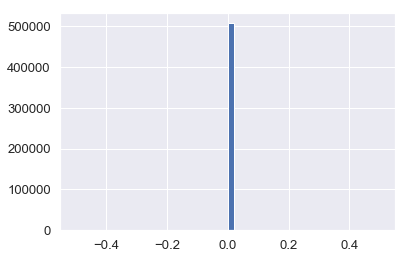

In [121]:
sub_DNN.loc[ sub_DNN['isFraud']>0.99 , 'isFraud'] = 1
b = plt.hist(sub_DNN['isFraud'], bins=50)

In [122]:
print ("Predicted {} frauds".format(int(sub_DNN[sub_DNN['isFraud']==1].sum())))

Predicted 0 frauds


#Conclusion

Feed PCA scaled data into a classifer, ada boost, xgboost, generate very short trys one or two steps. The first one learns and then it makes some error. Take the error and puts more weight on the error. If it pays to much attention error more. Aoc